# Lab 3: Image segmentation

 Dario Del Gaizo, Giulia Rebay, Isabella Rositi


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import sys
sys.path.append('/content/drive/MyDrive/CV_Labs/modules')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import PIL
import scipy.stats
from scipy.spatial import distance_matrix

from numpy.fft import fft2, ifft2, fftshift
from scipy.signal import convolve2d, correlate2d

from Functions import *
from gaussfft import gaussfft
from fftwave import fftwave

#1) Pillow

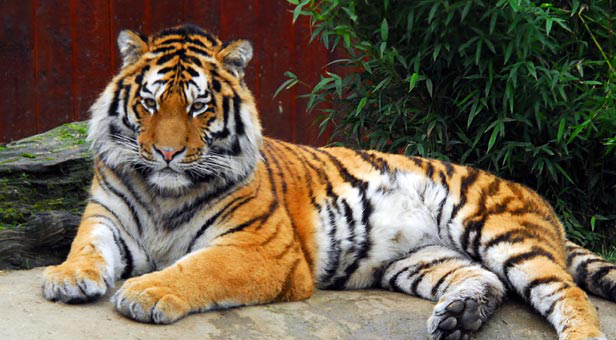

In [ ]:
from PIL import Image
path = '/content/drive/MyDrive/CV_Labs/modules/Images-jpg/'
orange = Image.open(path + 'orange.jpg')
tiger1 = Image.open(path + 'tiger1.jpg')
tiger2 = Image.open(path + 'tiger2.jpg')
tiger3 = Image.open(path + 'tiger3.jpg')
tiger1

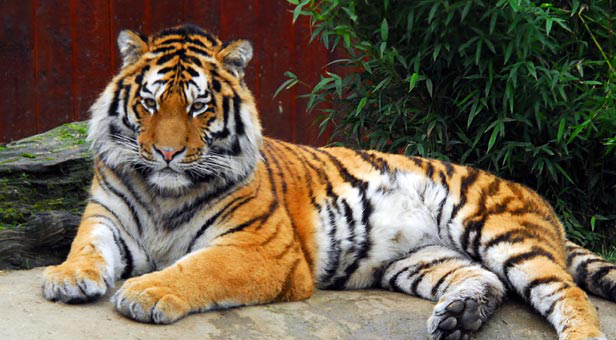

In [ ]:
#From image to array
I = np.asarray(tiger1)#.astype(np.float32) creates problems in the showing of the image.
Ivec = np.reshape(I , (-1, 3))
h = I.shape[0]
w = I.shape[1]

#From array to image
new_vec = np.reshape(I, (h, w, 3))
new_img = Image.fromarray(new_vec, 'RGB')
new_img

#2) K-means clustering

In [ ]:
def kmeans_segm(image, K, L, seed=0, delta_stop=0.01, custom_centers=None):
    np.random.seed(seed)

    image_as_cube = np.asarray(image) # HxWx3 cube
    flatten = np.reshape(image_as_cube , (-1, 3)) # flattened matrix
   # The idx of the centers must be taken from the array of unique pixels to avoid a pixel being center multiple times
    pixels = np.unique(flatten, axis=0)

    if custom_centers == "SPLIT":
        print('CUSTOM CENTER CHOICE: SPLIT')
        slices = np.array_split(pixels, K)
        centers = []
        for s in slices:
            center_idx = np.random.randint(low=0, high=np.shape(s)[0], size=1)
            centers.append(s[center_idx, :])
        centers = np.concatenate(list(centers), axis=0)

    else:
        centers_idx = np.random.randint(low=0, high=np.shape(pixels)[0], size=K)
        centers = pixels[centers_idx, :] # taking the rows that are going to be centers

   # Init old centers to keep track of progress in iterations
    old = np.zeros(np.shape(centers))

    for _ in range(L):
        distances = distance_matrix(flatten, centers)
        assignment = np.argmin(distances, axis=1) #idx of the closest center

        for center in range(K):
            old[center, :] = centers[center, :]
          #indexes of points around the center
            points_around_center = np.nonzero(assignment == center)
            points_around_center = np.reshape(points_around_center, (-1))

            mean = np.mean(flatten[points_around_center])

       # update
            centers[center, :] = mean

        if np.max(np.max(abs(old - centers))) < delta_stop:
            #print(f"Stopped at iteration: {_} of {L}")
            break

    if len(np.shape(image)) == 3:
        segmentation = np.reshape(assignment, (np.shape(image)[0], np.shape(image)[1]))
    else:
        segmentation = np.reshape(assignment, (np.shape(image)[0]))

    return segmentation, centers

Pre-processing:

In [ ]:
def rescale(img, scale):
  new_h = int(img.size[0]*scale)
  new_w = int(img.size[1]*scale)
  return img.resize((new_h, new_w))

In [ ]:
from PIL import ImageFilter
def apply_kmeans(image, K=4, iterations=50, sigma=1.0, scale=1.0):

  # Images rescaled
  image = rescale(image, scale)

  # Filter
  gfilter = ImageFilter.GaussianBlur(sigma)

  segm, cent = kmeans_segm(np.asarray(image.filter(gfilter)).astype(np.float32), K, iterations)

  new_seg = mean_segments(image, segm)
  bounds = overlay_bounds(image, segm)

  f = plt.figure(figsize = (24,10))
  plt.rc('axes', titlesize=10)
  plt.title("K=" + str(K))
  plt.axis('off')

  f.add_subplot(1, 3, 1)
  plt.imshow(image)
  plt.axis('off')
  f.add_subplot(1, 3, 2)
  plt.imshow(Image.fromarray(new_seg.astype(np.ubyte)))
  plt.axis('off')
  f.add_subplot(1, 3, 3)
  plt.imshow(Image.fromarray(bounds.astype(np.ubyte)))
  plt.axis('off')

  plt.show()

flatten (209440, 3)
Converge at 35


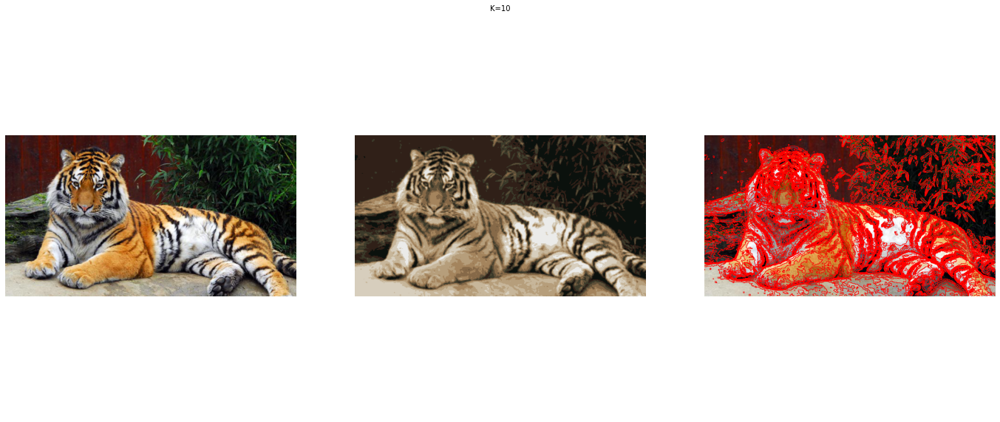

In [ ]:
apply_kmeans(tiger1, K=10, iterations=100)

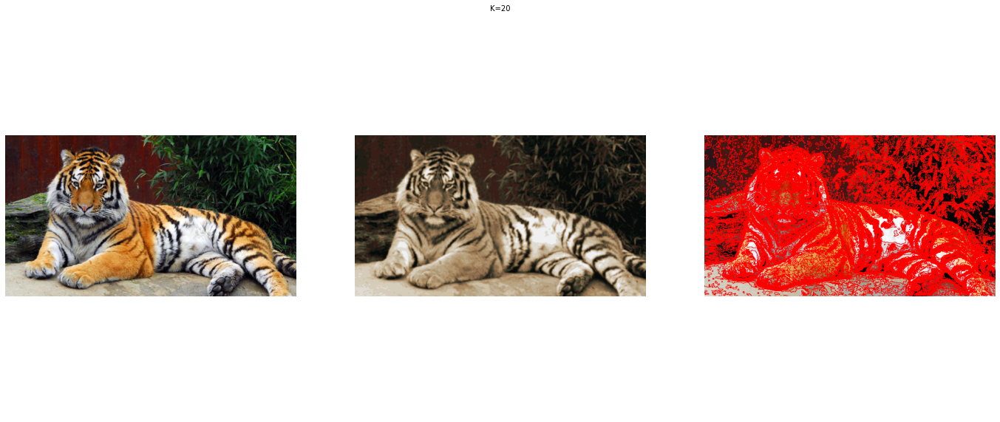

In [ ]:
apply_kmeans(tiger1, K=20, iterations=100)

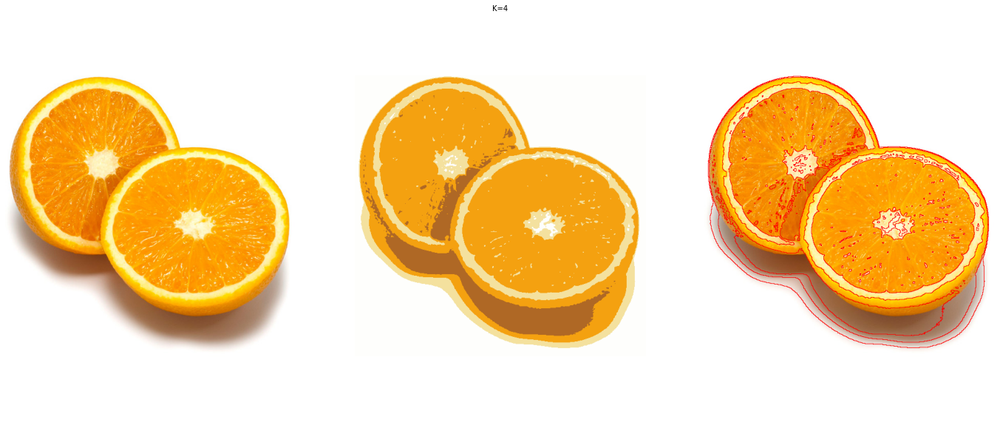

In [ ]:
apply_kmeans(orange)

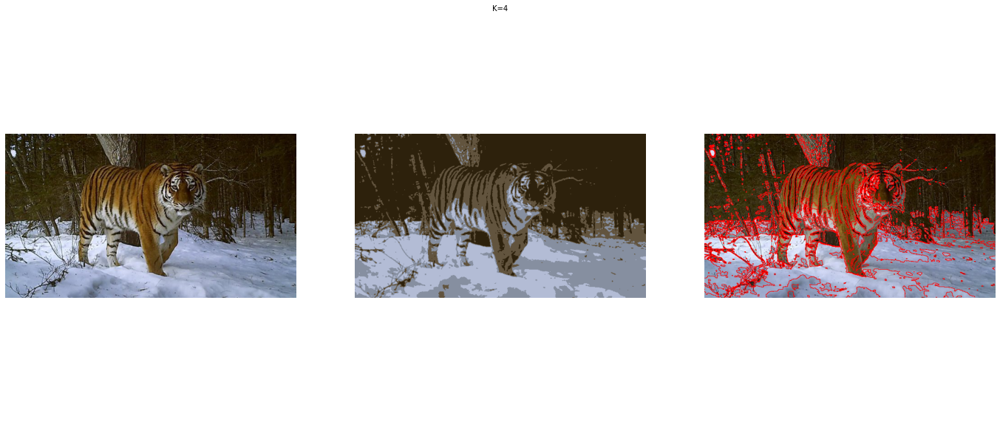

In [ ]:
apply_kmeans(tiger2)

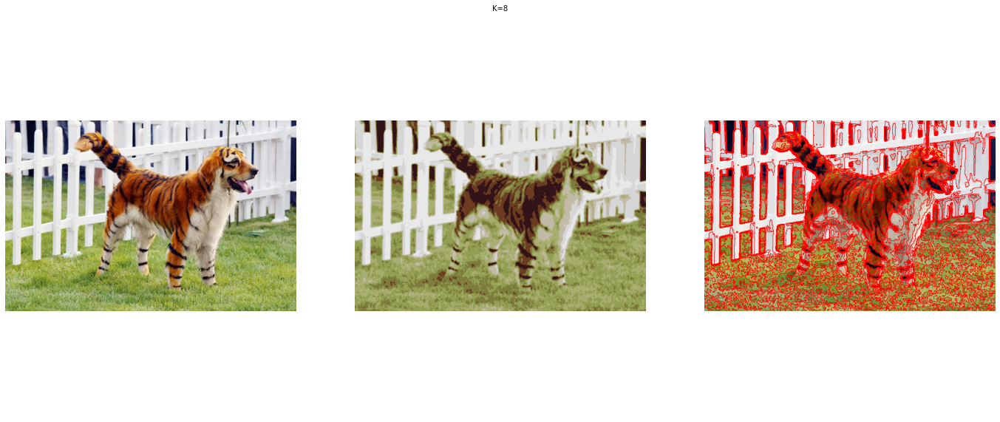

In [ ]:
apply_kmeans(tiger3, K=8)

The custom center choice yields a similar result to the random one.

Q1) How did you initialize the clustering process and why do you believe this was a good method of doing it?

A1) The random initialization avoids bias and is computationally efficient. Some methods choose the initial centroids to be the "representative" points of the dataset, such as the points with the highest variance or the points that are furthest from each other (in this case **white** and **orange**). These methods can help to improve the convergence of the algorithm and to produce more balanced clusters. In this case we could also apply the split of pixels into ordered K subsets and then pick the centers randomly from the subsets, this takes centers that are spread out more.

Q2) How many iterations L do you typically need to reach convergence, that is the point where no additional iterations will affect the end results?

A2) It depends on the conversion delta, the initial centers, the complexity of the image (diversity in pixels translates in more computational time) and the applied blurring. In this case when the delta reaches below 0.01 as a change in the mean, it stops. The number of iterations increases as the number of clusters increases.


Q3) What is the minimum value for K that you can use and still get no superpixel that covers parts from both halves of the orange? Illustrate with a figure.

A3) **K=6** divides the two halves of the orange while K=5 doesn't.

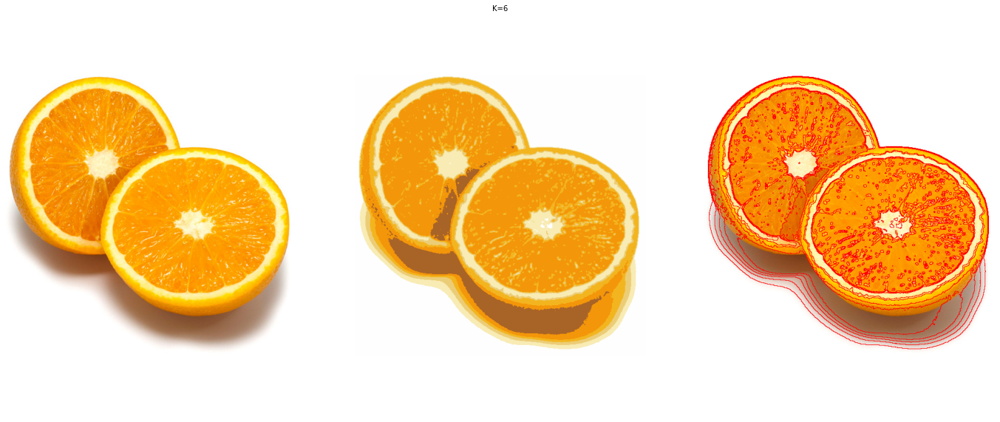

In [ ]:
apply_kmeans(orange, K=6)

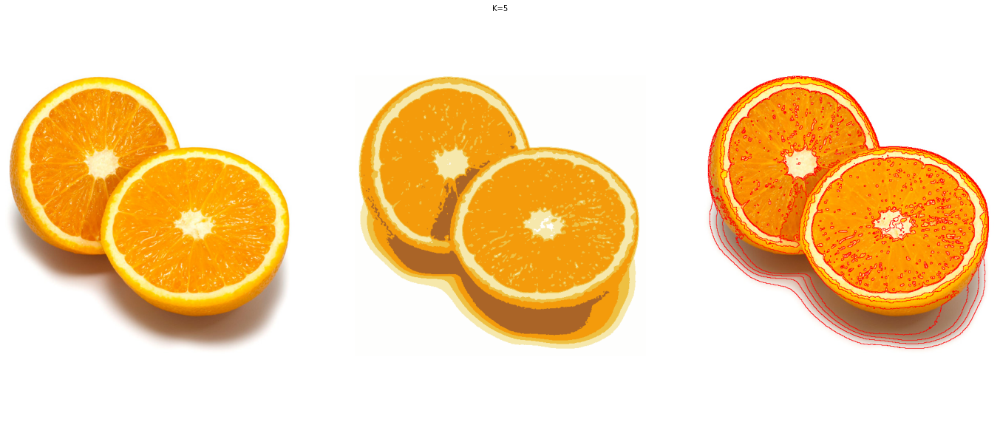

In [ ]:
apply_kmeans(orange, K=5)

Q4) What needs to be changed in the parameters to get suitable superpixels for the tiger images as well?

A4) First, increasing the number of clusters. As the pixels vary a lot, having more centers will spread them more in different clusters. The number of iterations has to be higher in order to converge. Alternatively, the blurring can be increased to reduce the pixel variance.


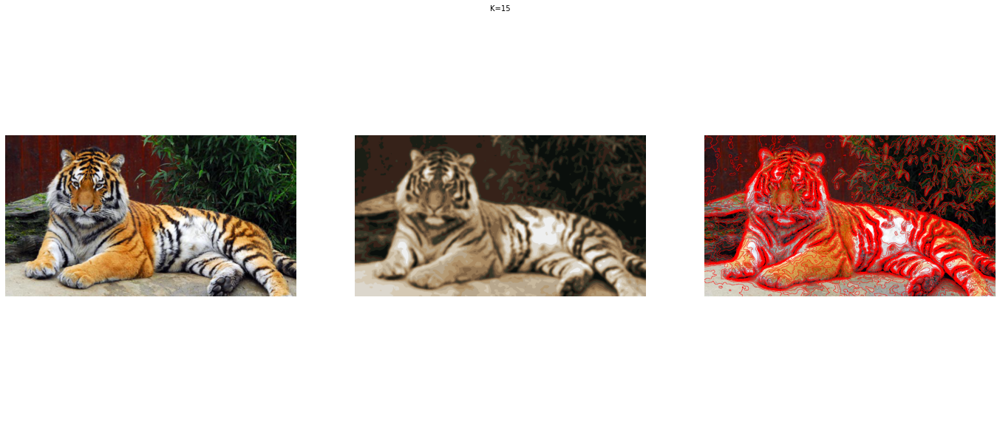

In [ ]:
apply_kmeans(tiger1, K=15, iterations=80, sigma=3.0, scale=1.5)

#3) Mean-shift segmentation

K-means clustering does not consider image positions for clustering. Spatially similar pixels
can still be grouped together in an post-processing step, in which connected components are found,
each component having a particular cluster colour. The segments could, however, stretch over large
parts of the image, if colours are similar, leading to an unnecessary fragmentation of the result.

$\hat{x} = [x, y, r, g, b]^T$

In [ ]:
from scipy.ndimage.filters import gaussian_filter
from Functions import mean_segments, overlay_bounds

def mean_shift_segm(I, spatial_bandwidth, colour_bandwidth, num_iterations):

    print('Find colour channels with K-means...')
    K = 16  # number of channels
    [segm, centers] = kmeans_segm(I, K, 20, 4321)
    (height, width, depth) = np.shape(I)
    idx = np.reshape(segm, (height, width))
    mapsw = np.zeros((height, width, K))
    mapsx = np.zeros((height, width, K))
    mapsy = np.zeros((height, width, K))
    [X, Y] = np.meshgrid(range(width), range(height))
    for k in range(K):
        mapsw[:, :, k] = (idx == k).astype(float)
        mapsx[:, :, k] = gaussian_filter(mapsw[:, :, k] * X, spatial_bandwidth, mode='nearest')
        mapsy[:, :, k] = gaussian_filter(mapsw[:, :, k] * Y, spatial_bandwidth, mode='nearest')
        mapsw[:, :, k] = gaussian_filter(mapsw[:, :, k], spatial_bandwidth, mode='nearest')
    mapsw = np.reshape(mapsw, (-1, K)) + 1e-6
    mapsx = np.reshape(mapsx, (-1, K))
    mapsy = np.reshape(mapsy, (-1, K))

    print('Search for high density points...')
    constC = -0.5 / (colour_bandwidth ** 2)
    x = np.reshape(X, (width * height,))
    y = np.reshape(Y, (width * height,))
    Ic = np.reshape(I, (width * height, 3))
    wei = np.exp(constC * (distance_matrix(Ic, centers) ** 2))
    for l in range(num_iterations):
        p = (np.round(y) * width + np.round(x)).astype(int)
        ww = mapsw[p, :] * wei
        w = np.sum(ww, axis=1)
        u = (np.matmul(ww, centers).T / w).T
        x = ((np.sum(mapsx[p, :] * wei, axis=1)).T / w).T
        y = ((np.sum(mapsy[p, :] * wei, axis=1)).T / w).T
        wei = (ww.T / w).T
        x = np.maximum(np.minimum(x, width - 1), 0)
        y = np.maximum(np.minimum(y, height - 1), 0)

    print('Assign high density points to pixels...')
    XY = np.stack((x, y))
    thr = 4.0
    val = 0
    mask = np.zeros((height * width, 1), dtype=np.short)
    for y in range(height):
        for x in range(width):
            p = y * width + x
            if mask[p] == 0:
                stack = [p]
                val = val + 1
                mask[p] = val
                while len(stack) > 0:
                    p0 = stack[-1]
                    xy = XY[:, p0]
                    y0 = int(p0 / width)
                    x0 = p0 - y0 * width
                    stack = stack[:-1]
                    pn = p0 + 1
                    if x0 < width - 1 and mask[pn] == 0 and (np.sum((xy - XY[:, pn]) ** 2) < thr):
                        stack = stack + [pn]
                        mask[pn] = val
                    pn = p0 - 1
                    if x0 > 0 and mask[pn] == 0 and (np.sum((xy - XY[:, pn]) ** 2) < thr):
                        stack = stack + [pn]
                        mask[pn] = val
                    pn = p0 + width
                    if y0 < height - 1 and mask[pn] == 0 and (np.sum((xy - XY[:, pn]) ** 2) < thr):
                        stack = stack + [pn]
                        mask[pn] = val
                    pn = p0 - width
                    if y0 > 0 and mask[pn] == 0 and (np.sum((xy - XY[:, pn]) ** 2) < thr):
                        stack = stack + [pn]
                        mask[pn] = val
    segm = np.reshape(mask, (height, width))
    return segm


def mean_shift_example(img, scale_factor=0.5, image_sigma=1.0, spatial_bandwidth=10.0, colour_bandwidth=20.0, num_iterations=40):

    img = img.resize((int(img.size[0] * scale_factor), int(img.size[1] * scale_factor)))

    h = ImageFilter.GaussianBlur(image_sigma)
    I = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)

    segm = mean_shift_segm(I, spatial_bandwidth, colour_bandwidth, num_iterations)
    Iseg = mean_segments(img, segm)
    if True:
        Inew = overlay_bounds(img, segm)

    plt.subplot(1, 2, 1)
    plt.imshow(Image.fromarray(Inew.astype(np.ubyte)))
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(Image.fromarray(Iseg.astype(np.ubyte)))
    plt.axis('off')
    plt.title("spatial_bw =" + str(spatial_bandwidth) + ", colour_bw = " + str(colour_bandwidth))
    plt.show()

Q5) How do the results change depending on the bandwidths? What settings did you prefer for the different images? Illustrate with an example image with the parameter that you think are suitable for that image.

A5)

**Spatial bandwidth**: how large is the mean calulation? Increasing the spatial bandwidth means taking more pixels in the mean calculation. The effect is a decreasing in the general variance of pixels as the uni-color regions will be larger, so *less modes*.

If s_bw is small, then we have more modes and more accurate pixel assignment.

If s_bw is large, then we have a broader Gaussian that results in blended neighbours.

**Colour bandwidth**: the radius of the colour space, the higher it is, the more non-similar colours will be considered the same.

These are two similar concepts and work similarly, but taking into account different properties such as position and colour.

$spatial_{bw}=3, \space\space colour_{bw}=9$

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


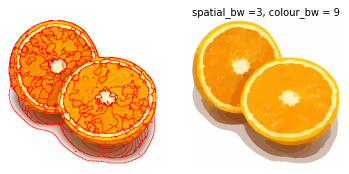

In [ ]:
mean_shift_example(orange, scale_factor=0.5, image_sigma=1.0, spatial_bandwidth=3, colour_bandwidth=9, num_iterations=40)

$spatial_{bw}=10, \space\space colour_{bw}=15$

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


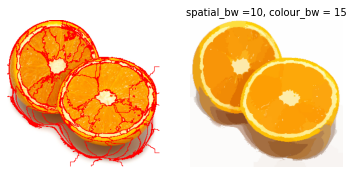

In [ ]:
mean_shift_example(orange, scale_factor=0.5, image_sigma=1.0, spatial_bandwidth=10, colour_bandwidth=15, num_iterations=40)

Playing with the Gaussian sigma:

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


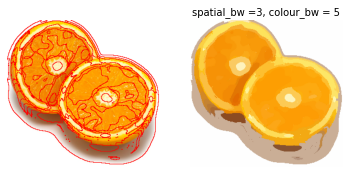

In [ ]:
mean_shift_example(orange, scale_factor=0.5, image_sigma=4, spatial_bandwidth=3, colour_bandwidth=5, num_iterations=40)

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


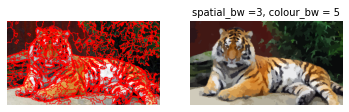

In [ ]:
mean_shift_example(tiger1, scale_factor=0.5, image_sigma=1.0, spatial_bandwidth=3, colour_bandwidth=5, num_iterations=40)

Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


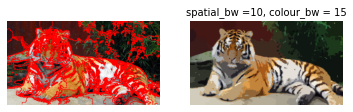

In [ ]:
mean_shift_example(tiger1, scale_factor=0.5, image_sigma=1.0, spatial_bandwidth=10, colour_bandwidth=15, num_iterations=40)

The image is clearly more uniform than before.

Q6) What kind of similarities and differences do you see between K-means and mean-shift segmentation?

A6)

Similarities:

Both K-means and mean-shift are clustering algorithms, which means that they are used to group similar data points together into clusters, in this case about image segmentation. Both algorithms use iterative procedures to find clusters.

Differences:
Mean-shift considers spatial information. K-means needs a number of clusters and mean-shift needs bandwidths. Outliers are more of a problem in K-means compared to mean-shift.


Find colour channels with K-means...
Search for high density points...
Assign high density points to pixels...


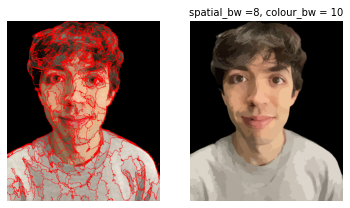

In [ ]:
# My photo
dario = Image.open(path + 'dario.jpg')
me = mean_shift_example(dario, scale_factor=0.5, image_sigma=1.0, spatial_bandwidth=8, colour_bandwidth=10, num_iterations=40)

#4) Normalized Cut

With mean-shift segmentation you cannot control in how many segments an image will be divided. It depends on how many modes (cluster centers) the method finds, which in turn depends on the bandwidths used and the particular image. In figure ground segmentation, however, you often like to limit the number of segments, preferably having one foreground segment and one background segment. A method that allows this is Normalized Cut.

Normalized Cut tries to minimize the similarities between pixels on the cut, while maximizing the similarities within each respective part of the cut.

In [ ]:
path = '/content/drive/MyDrive/CV_Labs/modules/Images-jpg/'

import sys
import math
import numpy as np
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt
from Functions import showgrey, mean_segments, overlay_bounds
from scipy.ndimage.filters import gaussian_filter
from scipy.spatial import distance_matrix
from scipy import sparse, optimize


def ncuts(A, D, n_ev):
    # Computes the n_ev smallest (non-zero) eigenvectors and eigenvalues of the
    # of the Laplacian of A, where D is diagonal matrix with the row sums of A
    L = (D - A) + 1e-3*sparse.identity(np.size(D, 0))
    success = True
    try:
        #EVal, EV = sparse.linalg.lobpcg(L, X, M=D, largest=False)
        EVal, EV = sparse.linalg.eigsh(L, k=n_ev, M=D, which='SM', tol=1e-3, maxiter=10000)
    except:
        print("Failed to find eigenvectors")
        EVal = np.array([ 0, 0 ])
        EV = np.zeros((np.size(L, axis=0), 2))
        success = False
    return EV, EVal, success


def ncuts_value(t, U2, W, D):
    x = np.where(U2 > t, 1, -1)
    d = D.diagonal()
    k = np.sum(d[x > 0]) / sum(d)
    b = k/(1 - k)
    y = (1 + x) - b*(1 - x)
    ncut = y.dot((D - W) @ y) / y.dot(D @ y)
    return ncut


def ncuts_partition(I, W, sNcut, sArea, id, maxDepth, depth):
    N = np.shape(W)[0]
    d = np.sum(W, axis=1)
    D = sparse.spdiags(d.reshape(-1), [0], N, N, format='csr') # D = diagonal matrix

    # Step 2 and 3. Solve generalized eigensystem (D -W)*S = S*D*U (12).
    # (13) is not necessary thanks to smart matlab. Get the 2 smallests ('sm')
    [EV, EVal, success] = ncuts(W, D, 2)

    # 2nd smallest (1st smallest has all same value elements, and useless)
    U2 = EV[:, 1]

    # Step 3. Refer 3.1 Example 3.
    # Bipartition the graph at point that Ncut is minimized.
    t = np.mean(U2)
    if success == True:
        t = optimize.minimize(ncuts_value, t, args=(U2, W, D), method='Nelder-Mead', options={'maxiter': 20}).x
    A = np.where(U2 > t)[0]
    B = np.where(U2 <= t)[0]

    # Step 4. Decide if the current partition should be divided
    #   if either of partition is too small, stop recursion.
    #   if Ncut is larger than threshold, stop recursion.
    if success == True:
        ncut = ncuts_value(t, U2, W, D)
    else:
        ncut = sNcut
    print(f'Cutting ncut=%.3f sizes=(%d,%d) %s' % (ncut, np.size(A), np.size(B), id))
    if np.size(A)<sArea or np.size(B)<sArea or ncut>=sNcut or depth>maxDepth:
        Seg = [ I ]
        Id = [ id ]     # for debugging
        Ncut = [ ncut ] # for debugging
        return Seg, Id, Ncut

    # recursively create segments of A
    SegA, IdA, NcutA = ncuts_partition(I[A], W[:,A][A,:], sNcut, sArea, id+'-A', maxDepth, depth+1)

    # recursively create segments of B
    SegB, IdB, NcutB = ncuts_partition(I[B], W[:,B][B,:], sNcut, sArea, id+'-B', maxDepth, depth+1)

    # concatenate cell arrays
    Seg  =  SegA + SegB
    Id   =  IdA + IdB
    Ncut =  NcutA + NcutB
    return Seg, Id, Ncut


def ncuts_affinity(im, XY_RADIUS, RGB_SIGMA):
    (h, w, _) = np.shape(im)

    # Find all pairs of pixels within a distance of XY_RADIUS
    rad = int(math.ceil(XY_RADIUS))
    [di,dj] = np.meshgrid(range(-rad, rad + 1), range(-rad, rad + 1))
    dv = (dj**2 + di**2) <= XY_RADIUS**2
    di = di[dv]
    dj = dj[dv]
    [i,j] = np.meshgrid(range(w), range(h))
    i = np.repeat(i[:, :, np.newaxis], len(di), axis=2)
    j = np.repeat(j[:, :, np.newaxis], len(di), axis=2)
    i_ = i - di
    j_ = j - dj
    v = np.where((i_ >= 0) & (i_ < w) & (j_ >= 0) & (j_ < h))
    pair_i =  j[v]*w +  i[v]
    pair_j = j_[v]*w + i_[v]

    # Weight each pair by the difference in RGB values, divided by RGB_SIGMA
    RGB = np.reshape(im/RGB_SIGMA, (-1, 3))
    R = RGB[pair_i,:]
    W = np.exp(-np.sum((RGB[pair_i,:] - RGB[pair_j,:])**2, axis=1)).astype(np.float64)

    # Construct an affinity matrix
    A = sparse.csr_matrix((W, (pair_i, pair_j)), shape=(w*h, w*h))

    return A


def norm_cuts_segm(I, colour_bandwidth, radius, ncuts_thresh, min_area, max_depth):

    (nRow, nCol, c) = np.shape(I)
    N = nRow * nCol
    V = np.reshape(I, (N, c))

    print('Compute affinity matrix...')
    W = ncuts_affinity(I, radius, colour_bandwidth)

    print('Solve eigenvalue problems to find partitions...')
    Seg = np.arange(N, dtype=np.int32)
    [Seg, Id, Ncut] = ncuts_partition(Seg, W, ncuts_thresh, min_area, 'ROOT', max_depth, 1)

    segm = np.zeros((N, 1), dtype=np.int32)
    for i in range(len(Seg)):
        segm[Seg[i]] = i
        print('Ncut = %f  %s' % (Ncut[i], Id[i]))

    segm = np.reshape(segm, (nRow, nCol)).astype(np.int32)
    return segm

def apply_normCuts(img, colour_bandwidth = 20.0, radius = 1, ncuts_thresh = 0.10, min_area = 200, max_depth = 12, scale_factor = 0.25, image_sigma = 0.5):

    # PARAMETERS:
    # colour_bandwidth = 20.0  # color bandwidth
    # radius = 1               # maximum neighbourhood distance
    # ncuts_thresh = 0.10      # cutting threshold
    # min_area = 200           # minimum area of segment
    # max_depth = 12           # maximum splitting depth
    # scale_factor = 0.25      # image downscale factor
    # image_sigma = 0.5        # image preblurring scale

    img = img.resize((int(img.size[0]*scale_factor), int(img.size[1]*scale_factor)))

    h = ImageFilter.GaussianBlur(image_sigma)
    I = np.asarray(img.filter(ImageFilter.GaussianBlur(image_sigma))).astype(np.float32)

    segm = norm_cuts_segm(I, colour_bandwidth, radius, ncuts_thresh, min_area, max_depth)
    Iseg = mean_segments(img, segm)
    if True:
        Inew = overlay_bounds(img, segm)

    plt.subplot(1, 2, 1)
    plt.imshow(Image.fromarray(Inew.astype(np.ubyte)))
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(Image.fromarray(Iseg.astype(np.ubyte)))
    plt.axis('off')
    plt.show()

In [ ]:
# Import images
orange = Image.open(path + 'orange.jpg')
tiger1 = Image.open(path + 'tiger1.jpg')
tiger2 = Image.open(path + 'tiger2.jpg')
tiger3 = Image.open(path + 'tiger3.jpg')

## Tiger 1

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.001 sizes=(8894,4196) ROOT
Cutting ncut=0.001 sizes=(6300,2594) ROOT-A
Cutting ncut=0.001 sizes=(698,5602) ROOT-A-A
Cutting ncut=0.001 sizes=(178,520) ROOT-A-A-A
Cutting ncut=0.000 sizes=(762,4840) ROOT-A-A-B
Cutting ncut=0.001 sizes=(126,636) ROOT-A-A-B-A
Cutting ncut=0.000 sizes=(972,3868) ROOT-A-A-B-B
Cutting ncut=0.000 sizes=(358,614) ROOT-A-A-B-B-A
Cutting ncut=0.001 sizes=(321,37) ROOT-A-A-B-B-A-A
Cutting ncut=0.001 sizes=(66,548) ROOT-A-A-B-B-A-B
Cutting ncut=0.000 sizes=(27,3841) ROOT-A-A-B-B-B
Cutting ncut=0.003 sizes=(878,1716) ROOT-A-B
Cutting ncut=0.005 sizes=(347,531) ROOT-A-B-A
Cutting ncut=0.002 sizes=(297,50) ROOT-A-B-A-A
Cutting ncut=0.017 sizes=(178,353) ROOT-A-B-A-B
Cutting ncut=0.002 sizes=(1027,689) ROOT-A-B-B
Cutting ncut=0.003 sizes=(730,297) ROOT-A-B-B-A
Cutting ncut=0.025 sizes=(309,421) ROOT-A-B-B-A-A
Cutting ncut=0.036 sizes=(5,304) ROOT-A-B-B-A-A-A
Cutting ncut=0.032 si

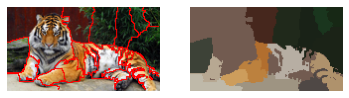

In [ ]:
apply_normCuts(tiger1)

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.000 sizes=(2142,10948) ROOT
Cutting ncut=0.001 sizes=(1370,772) ROOT-A
Cutting ncut=0.001 sizes=(652,718) ROOT-A-A
Cutting ncut=0.018 sizes=(632,20) ROOT-A-A-A
Cutting ncut=0.014 sizes=(83,635) ROOT-A-A-B
Cutting ncut=0.003 sizes=(250,522) ROOT-A-B
Cutting ncut=0.000 sizes=(220,30) ROOT-A-B-A
Cutting ncut=0.034 sizes=(54,468) ROOT-A-B-B
Cutting ncut=0.001 sizes=(4118,6830) ROOT-B
Cutting ncut=0.004 sizes=(2349,1769) ROOT-B-A
Cutting ncut=0.008 sizes=(964,1385) ROOT-B-A-A
Cutting ncut=0.050 sizes=(28,936) ROOT-B-A-A-A
Cutting ncut=0.010 sizes=(889,496) ROOT-B-A-A-B
Cutting ncut=0.044 sizes=(854,35) ROOT-B-A-A-B-A
Cutting ncut=0.019 sizes=(291,205) ROOT-B-A-A-B-B
Cutting ncut=0.036 sizes=(194,97) ROOT-B-A-A-B-B-A
Cutting ncut=0.028 sizes=(155,50) ROOT-B-A-A-B-B-B
Cutting ncut=0.009 sizes=(981,788) ROOT-B-A-B
Cutting ncut=0.010 sizes=(507,474) ROOT-B-A-B-A
Cutting ncut=0.028 sizes=(353,154) ROOT-B-A-

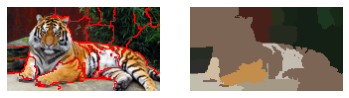

In [ ]:
apply_normCuts(tiger1, colour_bandwidth = 15)

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.004 sizes=(6638,6452) ROOT
Cutting ncut=0.012 sizes=(5266,1372) ROOT-A
Cutting ncut=0.011 sizes=(3430,1836) ROOT-A-A
Cutting ncut=0.572 sizes=(8,3422) ROOT-A-A-A
Cutting ncut=0.035 sizes=(879,957) ROOT-A-A-B
Cutting ncut=0.155 sizes=(218,661) ROOT-A-A-B-A
Cutting ncut=0.178 sizes=(78,140) ROOT-A-A-B-A-A
Cutting ncut=0.314 sizes=(15,63) ROOT-A-A-B-A-A-A
Cutting ncut=0.534 sizes=(99,41) ROOT-A-A-B-A-A-B
Cutting ncut=0.266 sizes=(275,386) ROOT-A-A-B-A-B
Cutting ncut=0.555 sizes=(259,16) ROOT-A-A-B-A-B-A
Cutting ncut=0.548 sizes=(8,378) ROOT-A-A-B-A-B-B
Cutting ncut=0.261 sizes=(312,645) ROOT-A-A-B-B
Cutting ncut=0.196 sizes=(91,221) ROOT-A-A-B-B-A
Cutting ncut=0.692 sizes=(72,19) ROOT-A-A-B-B-A-A
Cutting ncut=0.615 sizes=(100,121) ROOT-A-A-B-B-A-B
Cutting ncut=0.301 sizes=(378,267) ROOT-A-A-B-B-B
Cutting ncut=0.468 sizes=(175,203) ROOT-A-A-B-B-B-A
Cutting ncut=0.334 sizes=(136,131) ROOT-A-A-B-B-B-B
C

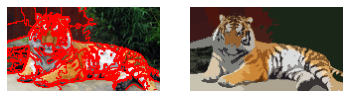

In [ ]:
apply_normCuts(tiger1, colour_bandwidth = 15, radius = 10, ncuts_thresh = 0.5, min_area = 20, max_depth = 6)

## Tiger 2

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.004 sizes=(8322,6078) ROOT
Cutting ncut=0.003 sizes=(4283,4039) ROOT-A
Cutting ncut=0.012 sizes=(2392,1891) ROOT-A-A
Cutting ncut=0.000 sizes=(2380,12) ROOT-A-A-A
Cutting ncut=0.005 sizes=(757,1134) ROOT-A-A-B
Cutting ncut=0.004 sizes=(255,502) ROOT-A-A-B-A
Cutting ncut=0.021 sizes=(218,37) ROOT-A-A-B-A-A
Cutting ncut=0.014 sizes=(290,212) ROOT-A-A-B-A-B
Cutting ncut=0.049 sizes=(160,130) ROOT-A-A-B-A-B-A
Cutting ncut=0.012 sizes=(173,39) ROOT-A-A-B-A-B-B
Cutting ncut=0.019 sizes=(555,579) ROOT-A-A-B-B
Cutting ncut=0.000 sizes=(1,554) ROOT-A-A-B-B-A
Cutting ncut=0.034 sizes=(225,354) ROOT-A-A-B-B-B
Cutting ncut=0.040 sizes=(103,122) ROOT-A-A-B-B-B-A
Cutting ncut=0.038 sizes=(170,184) ROOT-A-A-B-B-B-B
Cutting ncut=0.004 sizes=(2358,1681) ROOT-A-B
Cutting ncut=0.011 sizes=(1205,1153) ROOT-A-B-A
Cutting ncut=0.022 sizes=(521,684) ROOT-A-B-A-A
Cutting ncut=0.020 sizes=(229,292) ROOT-A-B-A-A-A
Cutting 

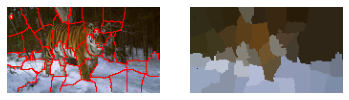

In [ ]:
apply_normCuts(tiger2, colour_bandwidth = 25)

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.000 sizes=(5048,9352) ROOT
Cutting ncut=0.001 sizes=(2669,2379) ROOT-A
Cutting ncut=0.010 sizes=(1374,1295) ROOT-A-A
Cutting ncut=0.013 sizes=(795,579) ROOT-A-A-A
Cutting ncut=0.028 sizes=(428,367) ROOT-A-A-A-A
Cutting ncut=0.032 sizes=(208,220) ROOT-A-A-A-A-A
Cutting ncut=0.056 sizes=(94,114) ROOT-A-A-A-A-A-A
Cutting ncut=0.041 sizes=(143,77) ROOT-A-A-A-A-A-B
Cutting ncut=0.024 sizes=(105,262) ROOT-A-A-A-A-B
Cutting ncut=0.017 sizes=(278,301) ROOT-A-A-A-B
Cutting ncut=0.027 sizes=(243,35) ROOT-A-A-A-B-A
Cutting ncut=0.000 sizes=(2,299) ROOT-A-A-A-B-B
Cutting ncut=-0.000 sizes=(1291,4) ROOT-A-A-B
Cutting ncut=0.000 sizes=(1013,1366) ROOT-A-B
Cutting ncut=0.001 sizes=(412,601) ROOT-A-B-A
Cutting ncut=0.003 sizes=(182,230) ROOT-A-B-A-A
Cutting ncut=0.000 sizes=(597,4) ROOT-A-B-A-B
Cutting ncut=0.006 sizes=(635,731) ROOT-A-B-B
Cutting ncut=0.003 sizes=(409,226) ROOT-A-B-B-A
Cutting ncut=0.000 sizes=(

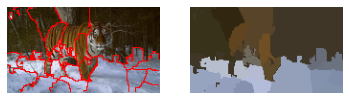

In [ ]:
apply_normCuts(tiger2, colour_bandwidth = 15)

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.005 sizes=(5701,8699) ROOT
Cutting ncut=0.010 sizes=(2704,2997) ROOT-A
Cutting ncut=0.094 sizes=(1309,1395) ROOT-A-A
Cutting ncut=0.151 sizes=(819,490) ROOT-A-A-A
Cutting ncut=0.175 sizes=(386,433) ROOT-A-A-A-A
Cutting ncut=0.261 sizes=(206,180) ROOT-A-A-A-A-A
Cutting ncut=0.558 sizes=(85,121) ROOT-A-A-A-A-A-A
Cutting ncut=0.295 sizes=(114,66) ROOT-A-A-A-A-A-B
Cutting ncut=0.413 sizes=(242,191) ROOT-A-A-A-A-B
Cutting ncut=0.484 sizes=(74,168) ROOT-A-A-A-A-B-A
Cutting ncut=0.407 sizes=(94,97) ROOT-A-A-A-A-B-B
Cutting ncut=0.220 sizes=(195,295) ROOT-A-A-A-B
Cutting ncut=0.135 sizes=(130,65) ROOT-A-A-A-B-A
Cutting ncut=0.304 sizes=(90,40) ROOT-A-A-A-B-A-A
Cutting ncut=0.488 sizes=(38,27) ROOT-A-A-A-B-A-B
Cutting ncut=0.465 sizes=(117,178) ROOT-A-A-A-B-B
Cutting ncut=0.721 sizes=(59,58) ROOT-A-A-A-B-B-A
Cutting ncut=0.492 sizes=(80,98) ROOT-A-A-A-B-B-B
Cutting ncut=0.101 sizes=(874,521) ROOT-A-A-B
Cut

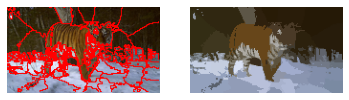

In [ ]:
apply_normCuts(tiger2, colour_bandwidth = 25, radius = 10, ncuts_thresh = 0.5, min_area = 20, max_depth = 6)

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.005 sizes=(5701,8699) ROOT
Cutting ncut=0.010 sizes=(2704,2997) ROOT-A
Cutting ncut=0.094 sizes=(1309,1395) ROOT-A-A
Cutting ncut=0.151 sizes=(819,490) ROOT-A-A-A
Cutting ncut=0.175 sizes=(386,433) ROOT-A-A-A-A
Cutting ncut=0.261 sizes=(206,180) ROOT-A-A-A-A-A
Cutting ncut=0.558 sizes=(121,85) ROOT-A-A-A-A-A-A
Cutting ncut=0.661 sizes=(85,36) ROOT-A-A-A-A-A-A-A
Cutting ncut=0.861 sizes=(28,57) ROOT-A-A-A-A-A-A-A-A
Cutting ncut=0.827 sizes=(20,16) ROOT-A-A-A-A-A-A-A-B
Cutting ncut=0.705 sizes=(49,36) ROOT-A-A-A-A-A-A-B
Cutting ncut=0.836 sizes=(25,24) ROOT-A-A-A-A-A-A-B-A
Cutting ncut=0.833 sizes=(17,19) ROOT-A-A-A-A-A-A-B-B
Cutting ncut=0.295 sizes=(66,114) ROOT-A-A-A-A-A-B
Cutting ncut=0.344 sizes=(38,28) ROOT-A-A-A-A-A-B-A
Cutting ncut=0.547 sizes=(29,9) ROOT-A-A-A-A-A-B-A-A
Cutting ncut=0.610 sizes=(13,15) ROOT-A-A-A-A-A-B-A-B
Cutting ncut=0.548 sizes=(58,56) ROOT-A-A-A-A-A-B-B
Cutting ncut=0.7

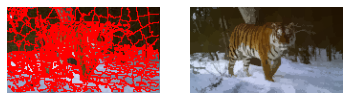

In [ ]:
apply_normCuts(tiger2, colour_bandwidth = 25, radius = 10, ncuts_thresh = 0.8, min_area = 20, max_depth = 12)

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.005 sizes=(5701,8699) ROOT
Cutting ncut=0.010 sizes=(2704,2997) ROOT-A
Cutting ncut=0.094 sizes=(1309,1395) ROOT-A-A
Cutting ncut=0.151 sizes=(819,490) ROOT-A-A-A
Cutting ncut=0.175 sizes=(386,433) ROOT-A-A-A-A
Cutting ncut=0.261 sizes=(206,180) ROOT-A-A-A-A-A
Cutting ncut=0.558 sizes=(85,121) ROOT-A-A-A-A-A-A
Cutting ncut=0.295 sizes=(66,114) ROOT-A-A-A-A-A-B
Cutting ncut=0.344 sizes=(28,38) ROOT-A-A-A-A-A-B-A
Cutting ncut=0.610 sizes=(13,15) ROOT-A-A-A-A-A-B-A-A
Cutting ncut=0.547 sizes=(9,29) ROOT-A-A-A-A-A-B-A-B
Cutting ncut=0.548 sizes=(56,58) ROOT-A-A-A-A-A-B-B
Cutting ncut=0.413 sizes=(242,191) ROOT-A-A-A-A-B
Cutting ncut=0.484 sizes=(168,74) ROOT-A-A-A-A-B-A
Cutting ncut=0.542 sizes=(81,87) ROOT-A-A-A-A-B-A-A
Cutting ncut=0.774 sizes=(35,39) ROOT-A-A-A-A-B-A-B
Cutting ncut=0.407 sizes=(94,97) ROOT-A-A-A-A-B-B
Cutting ncut=0.860 sizes=(56,38) ROOT-A-A-A-A-B-B-A
Cutting ncut=0.692 sizes=(31,

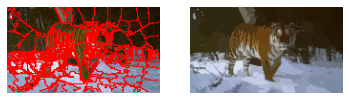

In [ ]:
apply_normCuts(tiger2, colour_bandwidth = 25, radius = 10, ncuts_thresh = 0.5, min_area = 20, max_depth = 12)

## Tiger 3

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.000 sizes=(10846,3854) ROOT
Cutting ncut=0.000 sizes=(130,10716) ROOT-A
Cutting ncut=0.000 sizes=(2183,1671) ROOT-B
Cutting ncut=0.002 sizes=(167,2016) ROOT-B-A
Cutting ncut=-0.000 sizes=(133,1538) ROOT-B-B
Ncut = 0.000000  ROOT-A
Ncut = 0.002060  ROOT-B-A
Ncut = -0.000000  ROOT-B-B


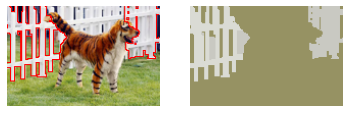

In [ ]:
apply_normCuts(tiger3)

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.067 sizes=(14579,121) ROOT
Cutting ncut=0.117 sizes=(14556,23) ROOT-A
Cutting ncut=0.010 sizes=(5463,9093) ROOT-A-A
Cutting ncut=0.003 sizes=(2411,3052) ROOT-A-A-A
Cutting ncut=0.066 sizes=(227,2184) ROOT-A-A-A-A
Cutting ncut=0.125 sizes=(52,175) ROOT-A-A-A-A-A
Cutting ncut=0.042 sizes=(30,22) ROOT-A-A-A-A-A-A
Cutting ncut=0.039 sizes=(97,78) ROOT-A-A-A-A-A-B
Cutting ncut=0.090 sizes=(1036,1148) ROOT-A-A-A-A-B
Cutting ncut=0.072 sizes=(931,105) ROOT-A-A-A-A-B-A
Cutting ncut=0.174 sizes=(571,577) ROOT-A-A-A-A-B-B
Cutting ncut=0.026 sizes=(1639,1413) ROOT-A-A-A-B
Cutting ncut=0.127 sizes=(652,987) ROOT-A-A-A-B-A
Cutting ncut=0.177 sizes=(58,594) ROOT-A-A-A-B-A-A
Cutting ncut=0.167 sizes=(469,518) ROOT-A-A-A-B-A-B
Cutting ncut=0.161 sizes=(1353,60) ROOT-A-A-A-B-B
Cutting ncut=0.248 sizes=(1288,65) ROOT-A-A-A-B-B-A
Cutting ncut=0.083 sizes=(47,13) ROOT-A-A-A-B-B-B
Cutting ncut=0.005 sizes=(6947,2146) 

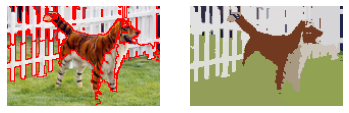

In [ ]:
apply_normCuts(tiger3, colour_bandwidth = 25, radius = 10, ncuts_thresh = 0.5, min_area = 20, max_depth = 6)

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.000 sizes=(99,14601) ROOT
Cutting ncut=0.000 sizes=(4,95) ROOT-A
Cutting ncut=0.001 sizes=(5996,8605) ROOT-B
Cutting ncut=0.000 sizes=(10,5986) ROOT-B-A
Cutting ncut=0.000 sizes=(6766,1839) ROOT-B-B
Cutting ncut=0.001 sizes=(6474,292) ROOT-B-B-A
Cutting ncut=0.013 sizes=(4023,2451) ROOT-B-B-A-A
Cutting ncut=0.015 sizes=(3285,738) ROOT-B-B-A-A-A
Cutting ncut=0.026 sizes=(2632,653) ROOT-B-B-A-A-A-A
Cutting ncut=0.059 sizes=(1644,988) ROOT-B-B-A-A-A-A-A
Cutting ncut=0.070 sizes=(769,875) ROOT-B-B-A-A-A-A-A-A
Cutting ncut=0.185 sizes=(108,661) ROOT-B-B-A-A-A-A-A-A-A
Cutting ncut=0.071 sizes=(69,39) ROOT-B-B-A-A-A-A-A-A-A-A
Cutting ncut=0.186 sizes=(461,200) ROOT-B-B-A-A-A-A-A-A-A-B
Cutting ncut=0.158 sizes=(434,441) ROOT-B-B-A-A-A-A-A-A-B
Cutting ncut=0.193 sizes=(211,223) ROOT-B-B-A-A-A-A-A-A-B-A
Cutting ncut=0.132 sizes=(11,430) ROOT-B-B-A-A-A-A-A-A-B-B
Cutting ncut=0.101 sizes=(353,635) ROOT-B-B-A-

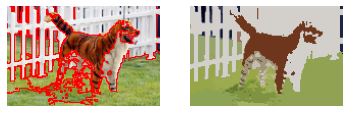

In [ ]:
apply_normCuts(tiger3, colour_bandwidth = 10, radius = 10, ncuts_thresh = 0.5, min_area = 20, max_depth = 10)

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.000 sizes=(99,14601) ROOT
Cutting ncut=0.000 sizes=(95,4) ROOT-A
Cutting ncut=0.001 sizes=(5995,8606) ROOT-B
Cutting ncut=0.000 sizes=(10,5985) ROOT-B-A
Cutting ncut=0.506 sizes=(7,3) ROOT-B-A-A
Cutting ncut=0.000 sizes=(13,5972) ROOT-B-A-B
Cutting ncut=-0.000 sizes=(6,7) ROOT-B-A-B-A
Cutting ncut=0.014 sizes=(5937,35) ROOT-B-A-B-B
Cutting ncut=0.000 sizes=(12,5925) ROOT-B-A-B-B-A
Cutting ncut=0.012 sizes=(4,8) ROOT-B-A-B-B-A-A
Cutting ncut=0.051 sizes=(5903,22) ROOT-B-A-B-B-A-B
Cutting ncut=0.003 sizes=(3599,2304) ROOT-B-A-B-B-A-B-A
Cutting ncut=0.000 sizes=(3,3596) ROOT-B-A-B-B-A-B-A-A
Cutting ncut=0.006 sizes=(2167,137) ROOT-B-A-B-B-A-B-A-B
Cutting ncut=-0.000 sizes=(2162,5) ROOT-B-A-B-B-A-B-A-B-A
Cutting ncut=0.000 sizes=(1,136) ROOT-B-A-B-B-A-B-A-B-B
Cutting ncut=0.000 sizes=(13,9) ROOT-B-A-B-B-A-B-B
Cutting ncut=0.000 sizes=(23,12) ROOT-B-A-B-B-B
Cutting ncut=0.003 sizes=(16,7) ROOT-B-A-B-B-

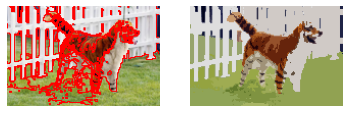

In [ ]:
apply_normCuts(tiger3, colour_bandwidth = 10, radius = 10, ncuts_thresh = 0.5, min_area = 10, max_depth = 10)

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.004 sizes=(103,14597) ROOT
Cutting ncut=0.002 sizes=(8,95) ROOT-A
Cutting ncut=0.000 sizes=(7,14590) ROOT-B
Ncut = 0.001934  ROOT-A
Ncut = 0.000057  ROOT-B


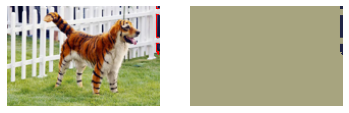

In [ ]:
apply_normCuts(tiger3, colour_bandwidth = 15, radius = 10, ncuts_thresh = 0.5, min_area = 10, max_depth = 10)

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.000 sizes=(99,14601) ROOT
Cutting ncut=0.000 sizes=(95,4) ROOT-A
Cutting ncut=0.001 sizes=(5996,8605) ROOT-B
Cutting ncut=0.000 sizes=(5986,10) ROOT-B-A
Cutting ncut=0.000 sizes=(13,5973) ROOT-B-A-A
Cutting ncut=-0.000 sizes=(6,7) ROOT-B-A-A-A
Cutting ncut=0.014 sizes=(5938,35) ROOT-B-A-A-B
Cutting ncut=-0.000 sizes=(5926,12) ROOT-B-A-A-B-A
Cutting ncut=0.047 sizes=(5899,27) ROOT-B-A-A-B-A-A
Cutting ncut=0.003 sizes=(3600,2299) ROOT-B-A-A-B-A-A-A
Cutting ncut=0.000 sizes=(3597,3) ROOT-B-A-A-B-A-A-A-A
Cutting ncut=0.006 sizes=(2162,137) ROOT-B-A-A-B-A-A-A-B
Cutting ncut=0.040 sizes=(105,2057) ROOT-B-A-A-B-A-A-A-B-A
Cutting ncut=0.004 sizes=(20,85) ROOT-B-A-A-B-A-A-A-B-A-A
Cutting ncut=0.096 sizes=(23,2034) ROOT-B-A-A-B-A-A-A-B-A-B
Cutting ncut=0.000 sizes=(136,1) ROOT-B-A-A-B-A-A-A-B-B
Cutting ncut=0.000 sizes=(18,9) ROOT-B-A-A-B-A-A-B
Cutting ncut=0.012 sizes=(4,8) ROOT-B-A-A-B-A-B
Cutting ncut=0.

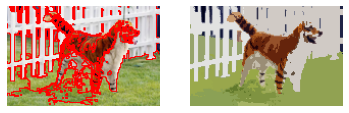

In [ ]:
apply_normCuts(tiger3, colour_bandwidth = 10, radius = 10, ncuts_thresh = 0.8, min_area = 10, max_depth = 10)

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.000 sizes=(3024,11676) ROOT
Cutting ncut=0.000 sizes=(2128,896) ROOT-A
Cutting ncut=0.030 sizes=(93,2035) ROOT-A-A
Cutting ncut=0.003 sizes=(66,27) ROOT-A-A-A
Cutting ncut=0.045 sizes=(12,54) ROOT-A-A-A-A
Cutting ncut=0.282 sizes=(6,6) ROOT-A-A-A-A-A
Cutting ncut=0.016 sizes=(4,50) ROOT-A-A-A-A-B
Cutting ncut=0.009 sizes=(17,10) ROOT-A-A-A-B
Cutting ncut=0.139 sizes=(3,14) ROOT-A-A-A-B-A
Cutting ncut=0.199 sizes=(1,9) ROOT-A-A-A-B-B
Cutting ncut=0.046 sizes=(190,1845) ROOT-A-A-B
Cutting ncut=0.007 sizes=(123,67) ROOT-A-A-B-A
Cutting ncut=0.031 sizes=(59,64) ROOT-A-A-B-A-A
Cutting ncut=0.112 sizes=(54,5) ROOT-A-A-B-A-A-A
Cutting ncut=0.030 sizes=(50,14) ROOT-A-A-B-A-A-B
Cutting ncut=0.188 sizes=(23,27) ROOT-A-A-B-A-A-B-A
Cutting ncut=0.666 sizes=(13,10) ROOT-A-A-B-A-A-B-A-A
Cutting ncut=0.698 sizes=(4,9) ROOT-A-A-B-A-A-B-A-A-A
Cutting ncut=0.685 sizes=(9,1) ROOT-A-A-B-A-A-B-A-A-B
Cutting ncut=0.417

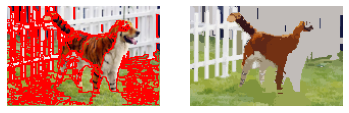

In [ ]:
apply_normCuts(tiger3, colour_bandwidth = 10, radius = 5, ncuts_thresh = 0.8, min_area = 10, max_depth = 15)

## Orange

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.001 sizes=(11841,7750) ROOT
Cutting ncut=0.000 sizes=(7685,4156) ROOT-A
Cutting ncut=0.000 sizes=(4377,3308) ROOT-A-A
Cutting ncut=0.000 sizes=(781,3596) ROOT-A-A-A
Cutting ncut=0.002 sizes=(476,305) ROOT-A-A-A-A
Cutting ncut=0.009 sizes=(145,331) ROOT-A-A-A-A-A
Cutting ncut=0.001 sizes=(130,175) ROOT-A-A-A-A-B
Cutting ncut=0.000 sizes=(624,2972) ROOT-A-A-A-B
Cutting ncut=0.007 sizes=(422,202) ROOT-A-A-A-B-A
Cutting ncut=0.005 sizes=(237,185) ROOT-A-A-A-B-A-A
Cutting ncut=0.000 sizes=(176,26) ROOT-A-A-A-B-A-B
Cutting ncut=0.013 sizes=(1480,1492) ROOT-A-A-A-B-B
Cutting ncut=0.021 sizes=(510,970) ROOT-A-A-A-B-B-A
Cutting ncut=0.000 sizes=(1,509) ROOT-A-A-A-B-B-A-A
Cutting ncut=-0.000 sizes=(968,2) ROOT-A-A-A-B-B-A-B
Cutting ncut=0.000 sizes=(50,1442) ROOT-A-A-A-B-B-B
Cutting ncut=0.001 sizes=(3128,180) ROOT-A-A-B
Cutting ncut=0.003 sizes=(3959,197) ROOT-A-B
Cutting ncut=0.004 sizes=(1341,6409) ROOT-

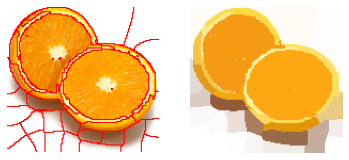

In [ ]:
apply_normCuts(orange)

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.000 sizes=(10552,9039) ROOT
Cutting ncut=0.045 sizes=(10317,235) ROOT-A
Cutting ncut=0.011 sizes=(8759,1558) ROOT-A-A
Cutting ncut=0.010 sizes=(3801,4958) ROOT-A-A-A
Cutting ncut=0.149 sizes=(1815,1986) ROOT-A-A-A-A
Cutting ncut=0.066 sizes=(1476,339) ROOT-A-A-A-A-A
Cutting ncut=0.267 sizes=(132,1854) ROOT-A-A-A-A-B
Cutting ncut=0.173 sizes=(2623,2335) ROOT-A-A-A-B
Cutting ncut=0.124 sizes=(231,2392) ROOT-A-A-A-B-A
Cutting ncut=0.224 sizes=(1082,1253) ROOT-A-A-A-B-B
Cutting ncut=0.033 sizes=(510,1048) ROOT-A-A-B
Cutting ncut=0.070 sizes=(305,205) ROOT-A-A-B-A
Cutting ncut=0.122 sizes=(135,170) ROOT-A-A-B-A-A
Cutting ncut=0.198 sizes=(137,68) ROOT-A-A-B-A-B
Cutting ncut=0.055 sizes=(529,519) ROOT-A-A-B-B
Cutting ncut=0.080 sizes=(189,340) ROOT-A-A-B-B-A
Cutting ncut=0.089 sizes=(303,216) ROOT-A-A-B-B-B
Cutting ncut=0.061 sizes=(156,79) ROOT-A-B
Cutting ncut=0.459 sizes=(56,100) ROOT-A-B-A
Cutting n

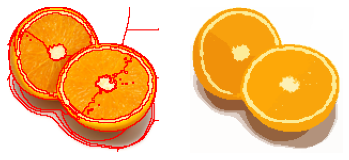

In [ ]:
apply_normCuts(orange, colour_bandwidth = 20, radius = 15, ncuts_thresh = 0.5, min_area = 60, max_depth = 5)

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.000 sizes=(9039,10552) ROOT
Cutting ncut=0.002 sizes=(5448,3591) ROOT-A
Cutting ncut=0.005 sizes=(3560,1888) ROOT-A-A
Cutting ncut=0.007 sizes=(2954,606) ROOT-A-A-A
Cutting ncut=0.124 sizes=(2598,356) ROOT-A-A-A-A
Cutting ncut=0.235 sizes=(1383,1215) ROOT-A-A-A-A-A
Cutting ncut=0.383 sizes=(783,600) ROOT-A-A-A-A-A-A
Cutting ncut=0.564 sizes=(316,467) ROOT-A-A-A-A-A-A-A
Cutting ncut=0.577 sizes=(459,141) ROOT-A-A-A-A-A-A-B
Cutting ncut=0.265 sizes=(153,1062) ROOT-A-A-A-A-A-B
Cutting ncut=0.514 sizes=(39,114) ROOT-A-A-A-A-A-B-A
Cutting ncut=0.398 sizes=(660,402) ROOT-A-A-A-A-A-B-B
Cutting ncut=0.566 sizes=(318,342) ROOT-A-A-A-A-A-B-B-A
Cutting ncut=0.695 sizes=(348,54) ROOT-A-A-A-A-A-B-B-B
Cutting ncut=0.169 sizes=(212,144) ROOT-A-A-A-A-B
Cutting ncut=0.199 sizes=(135,77) ROOT-A-A-A-A-B-A
Cutting ncut=0.304 sizes=(66,69) ROOT-A-A-A-A-B-A-A
Cutting ncut=0.480 sizes=(27,39) ROOT-A-A-A-A-B-A-A-A
Cuttin

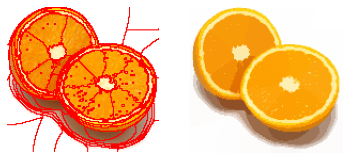

In [ ]:
apply_normCuts(orange, colour_bandwidth = 20, radius = 15, ncuts_thresh = 0.5, min_area = 60, max_depth = 10)

Compute affinity matrix...
Solve eigenvalue problems to find partitions...
Cutting ncut=0.000 sizes=(9049,10542) ROOT
Cutting ncut=0.001 sizes=(3522,5527) ROOT-A
Cutting ncut=0.008 sizes=(2795,727) ROOT-A-A
Cutting ncut=0.340 sizes=(2733,62) ROOT-A-A-A
Cutting ncut=0.207 sizes=(1265,1468) ROOT-A-A-A-A
Cutting ncut=0.410 sizes=(794,471) ROOT-A-A-A-A-A
Cutting ncut=0.456 sizes=(376,418) ROOT-A-A-A-A-A-A
Cutting ncut=0.857 sizes=(194,182) ROOT-A-A-A-A-A-A-A
Cutting ncut=0.748 sizes=(211,207) ROOT-A-A-A-A-A-A-B
Cutting ncut=0.661 sizes=(153,318) ROOT-A-A-A-A-A-B
Cutting ncut=0.338 sizes=(847,621) ROOT-A-A-A-A-B
Cutting ncut=0.484 sizes=(269,578) ROOT-A-A-A-A-B-A
Cutting ncut=0.845 sizes=(9,260) ROOT-A-A-A-A-B-A-A
Cutting ncut=0.596 sizes=(281,297) ROOT-A-A-A-A-B-A-B
Cutting ncut=0.618 sizes=(317,304) ROOT-A-A-A-A-B-B
Cutting ncut=0.063 sizes=(31,31) ROOT-A-A-A-B
Cutting ncut=0.224 sizes=(67,660) ROOT-A-A-B
Cutting ncut=0.073 sizes=(8,59) ROOT-A-A-B-A
Cutting ncut=0.242 sizes=(493,167) ROOT

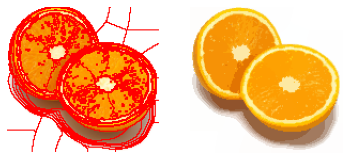

In [ ]:
apply_normCuts(orange, colour_bandwidth = 10, radius = 15, ncuts_thresh = 0.5, min_area = 60, max_depth = 10)

# 5) Segmentation using graph cuts

In [ ]:
def mixture_prob(image, K, L, mask):

    image = image / 255

    Ivec = np.reshape(image, (-1, 3)).astype(np.float32)
    m = np.reshape(mask, (-1))
    masked = Ivec[np.reshape(np.nonzero(m == 1), (-1))]
    size = np.shape(masked)[0]

    segs, centers = kmeans_segm(masked, K, L)

    covariances = []
    p = np.ones((size, K)) * 0.001
    gauss = np.zeros((size, K))

    for i in range(K):
        covariances.append(np.eye(3) * 0.01)


    w = np.zeros(K)

    for i in range(K):
        w[i] = len(np.nonzero(segs == i)) / size

    for i in range(L):
        for j in range(K):
            # print(centers[j])
            gauss[:, j] = w[j] * scipy.stats.multivariate_normal(centers[j], covariances[j]).pdf(masked)

        for j in range(K):
            p[:, j] = np.divide(gauss[:, j], np.sum(gauss, axis=1), where=np.sum(gauss, axis=1)!=0)

        for j in range(K):
            w[j] = np.mean(p[:,j])
            centers[j,:] = np.dot(np.transpose(p[:, j]), masked) / np.sum(p[:, j])
            diff = masked - centers[j,:]
            covariances[j] = np.dot(np.transpose(diff), diff * np.reshape(p[:, j], (-1, 1))) / np.sum(p[:, j])

    prob = np.zeros((np.shape(Ivec)[0], K))

    for i in range(K):
        prob[:, i] = w[i] * scipy.stats.multivariate_normal(centers[i], covariances[i]).pdf(Ivec)
        prob[:, i] = prob[:, i] / np.sum(prob[:, i])

    prob = np.sum(prob, axis=1)
    prob = np.reshape(prob, (np.shape(image)[0], np.shape(image)[1]))

    return prob

In [ ]:
#manually import graphcut_example()

def cmf_cut(ur, alpha):
    [rows, cols] = np.shape(ur)
    imgSize = rows * cols

    cc = 0.3  # step-size of the augmented Lagrangian method, typically [0.3, 3]
    errbound = 1e-4  # error bound for convergence
    numIter = 100  # maximum iteration number (100)
    steps = 0.16  # step-size for gradient projection step to total variation, typically [0.1, 0.17]

    # build up the data terms
    urb = 0.8 * ur + 0.1
    Cs = -np.log(1.0 - urb).astype(np.float32)
    Ct = -np.log(urb).astype(np.float32)

    # the initial value of u is set to be an initial cut, see below.
    u = np.where(Cs > Ct, 1.0, 0.0).astype(np.float32)
    # the initial values of two terminal flows ps and pt are set to be the specified legal flows.
    ps = np.minimum(Cs, Ct)
    pt = ps

    # the initial value of the spatial flow fiels p = (pp1, pp2) is set to be zero.
    pp1 = np.zeros((rows, cols + 1), dtype=np.float32)
    pp2 = np.zeros((rows + 1, cols), dtype=np.float32)
    divp = pp1[:, 1:cols + 1] - pp1[:, 0:cols] + pp2[1:rows + 1, :] - pp2[0:rows, :]

    erriter = np.zeros((numIter, 1))

    for i in range(numIter):
        # update the spatial flow field p = (pp1, pp2):
        #   the following steps are the gradient descent step with steps as the step-size.
        pts = divp - (ps - pt + u / cc)
        pp1[:, 1:cols] = pp1[:, 1:cols] + steps * (pts[:, 1:cols] - pts[:, 0:cols - 1])
        pp2[1:rows, :] = pp2[1:rows, :] + steps * (pts[1:rows, :] - pts[0:rows - 1, :])

        # the following steps give the projection to make |p(x)| <= alpha(x)
        gk = np.sqrt(
            (pp1[:, 0:cols] ** 2 + pp1[:, 1:cols + 1] ** 2 + pp2[0:rows, :] ** 2 + pp2[1:rows + 1, :] ** 2) * 0.5)
        gk = (np.where(gk <= alpha, 1, 0) + np.where(gk <= alpha, 0, 1) * (gk / alpha)).astype(np.float32)
        gk = 1 / gk

        pp1[:, 1:cols] = (0.5 * (gk[:, 1:cols] + gk[:, 0:cols - 1])) * pp1[:, 1:cols]
        pp2[1:rows, :] = (0.5 * (gk[1:rows, :] + gk[0:rows - 1, :])) * pp2[1:rows, :]
        divp = pp1[:, 1:cols + 1] - pp1[:, 0:cols] + pp2[1:rows + 1, :] - pp2[0:rows, :]

        # updata the source flow ps
        pts = divp + pt - u / cc + 1 / cc
        ps = np.minimum(pts, Cs)

        # update the sink flow pt
        pts = - divp + ps + u / cc
        pt = np.minimum(pts, Ct)

        # update the multiplier u
        erru = cc * (divp + pt - ps)
        u = u - erru

        # evaluate the avarage error
        erriter[i] = np.sum(np.abs(erru)) / imgSize

        if erriter[i] < errbound:
            break

    #print('number of iterations = %u' % (i + 1))
    return u, erriter, i


def graphcut_segm(I, area, K, alpha, sigma):
    [minx, miny, maxx, maxy] = area
    [h, w, c] = np.shape(I)
    dw = maxx - minx + 1
    dh = maxy - miny + 1
    mask = np.zeros((h, w), dtype=np.int16)
    mask[miny:miny + dh, minx:minx + dw] = 1
    grey = 0.2989 * I[:, :, 0] + 0.5870 * I[:, :, 1] + 0.1140 * I[:, :, 2]
    # showgrey(mask)
    blur = 0.5  # amount of blur to reduce noise
    gauss = np.array([[math.exp(-(i * i) / (2 * blur * blur)) for i in range(-3, 4)]], dtype=np.float32)
    gauss = gauss / np.sum(gauss)  # normalize to one
    grey = convolve2d(grey, gauss.T @ gauss, 'same', 'symm')

    sobel = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=np.float32) / 4
    dx = convolve2d(grey, sobel, 'same', 'fill', 0)
    dy = convolve2d(grey, sobel.T, 'same', 'fill', 0)
    grad = np.sqrt(dx ** 2 + dy ** 2)

    edge = (alpha * sigma) * np.ones((h, w)) / (grad + sigma)

    for l in range(3):
        #print('Find Gaussian mixture models...')
        fprob = mixture_prob(I, K, 10, mask)
        bprob = mixture_prob(I, K, 10, 1 - mask)
        prior = np.reshape(fprob / (fprob + bprob), (h, w))

        #print('Find minimum cut...')
        [u, erriter, i] = cmf_cut(prior, edge)
        mask = (u > 0.5).astype(np.int16)

    return mask, prior


##############################


def graphcut_example(img, K = 16, alpha = 40.0, sigma = 10.0, scale_factor = 0.5, area = [80, 110, 570, 300]):
    #scale_factor: image downscale factor
    # area: image region to train foreground with [ minx, miny, maxx, maxy ]
    #K: number of mixture components
    #alpha: maximum edge cost
    #sigma: edge cost decay factor

    # # img = Image.open('Images-jpg/tiger1.jpg')

    # # img = Image.open('Images-jpg/orange.jpg')
    # # area = [60, 50, 550, 300]

    # img = Image.open(path + "tiger1.jpg")
    # area = [210, 105, 420, 210]
    # # img = Image.open('Images-jpg/tiger3.jpg')
    # # area = [120, 110, 500, 300]

    img = img.resize((int(img.size[0] * scale_factor), int(img.size[1] * scale_factor)))

    area = [int(i * scale_factor) for i in area]
    I = np.asarray(img).astype(np.float32)
    segm, prior = graphcut_segm(I, area, K, alpha, sigma)

    Iseg = mean_segments(img, segm)
    if True:
        Inew = overlay_bounds(img, segm)

    img = Image.fromarray(Inew.astype(np.ubyte))

    f = plt.figure(figsize = (15,10))
    plt.rc('axes', titlesize=10)

    f.add_subplot(1,2,1)
    plt.imshow(img)
    plt.axis('off')
    f.add_subplot(1, 2, 2, title = "K=" + str(K) + ", alpha=" + str(alpha) + ", sigma=" + str(sigma))
    plt.imshow(Image.fromarray(Iseg.astype(np.ubyte)))
    plt.show()

Question 11: Does the ideal choice of alpha and sigma vary a lot between different images?
Illustrate with an example image with the parameters you prefer.

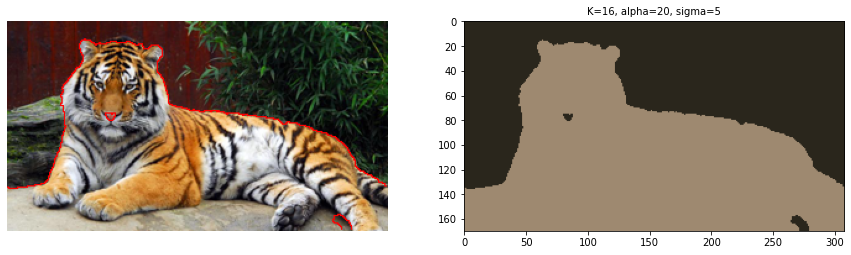

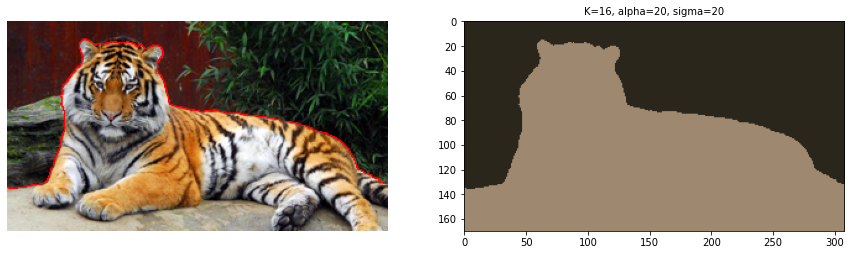

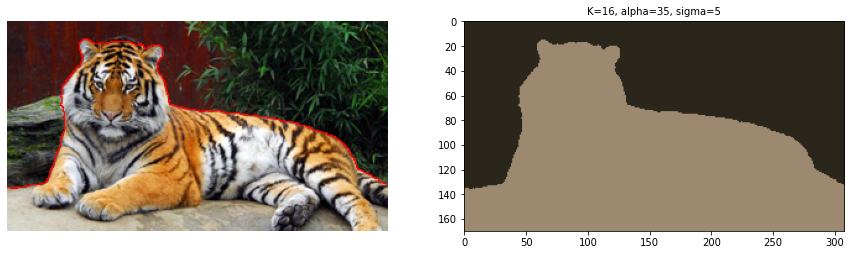

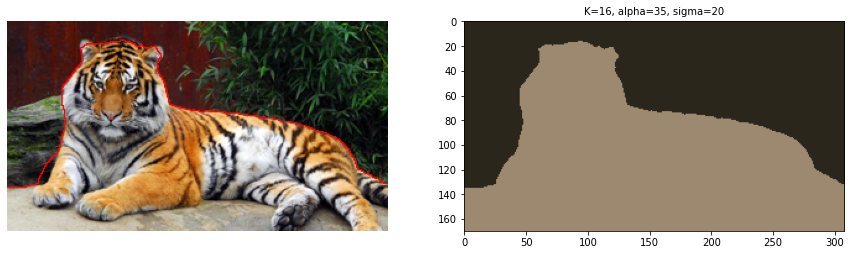

In [ ]:
#tiger 1
alphas = [20, 35]
sigmas = [5, 20]

for a in alphas:
    for s in sigmas:
        graphcut_example(tiger1, K = 16, alpha = a, sigma = s, scale_factor = 0.5, area = [ 80, 110, 570, 300 ])

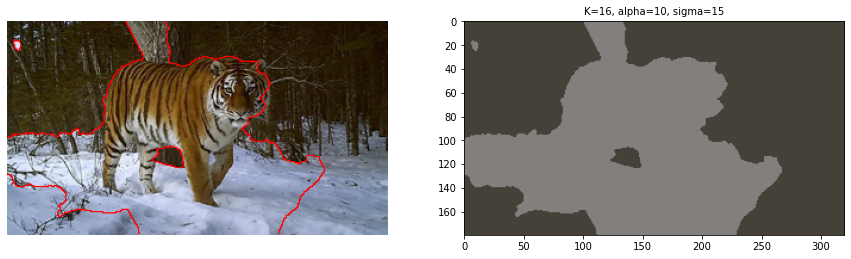

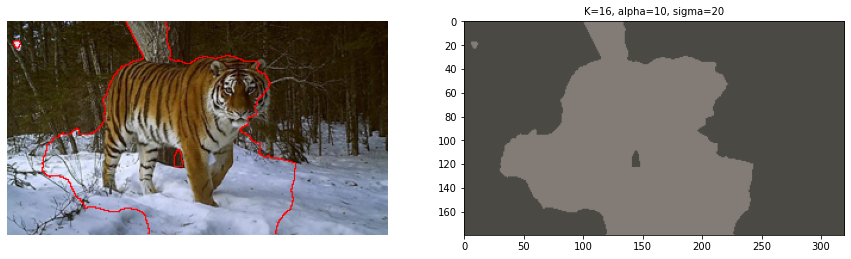

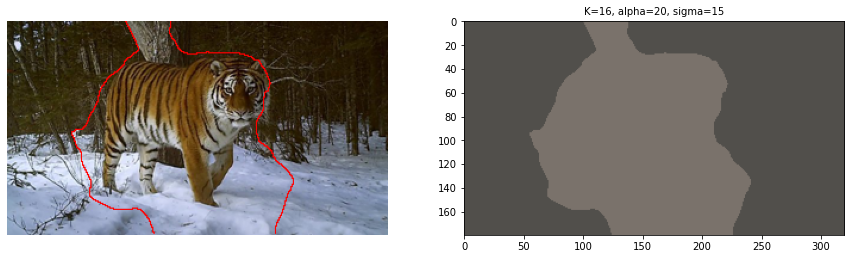

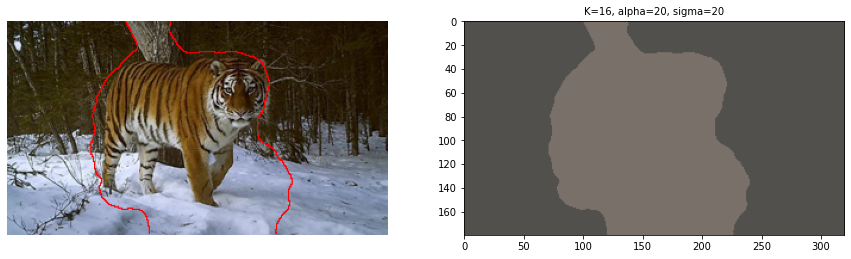

In [ ]:
#tiger2
alphas = [10, 20]
sigmas = [15, 20]

for a in alphas:
    for s in sigmas:
        graphcut_example(tiger2, K = 16, alpha = a, sigma = s, scale_factor = 0.5, area = [80, 110, 570, 300])

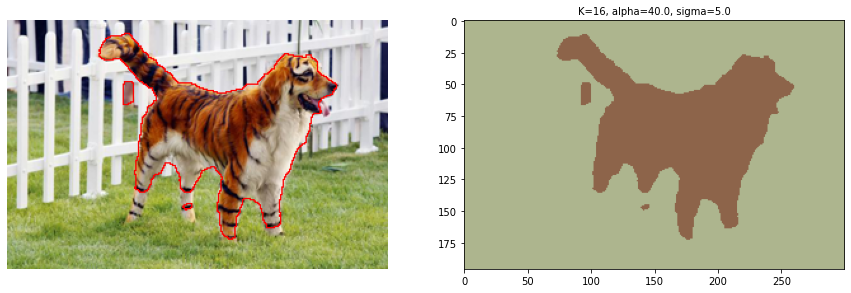

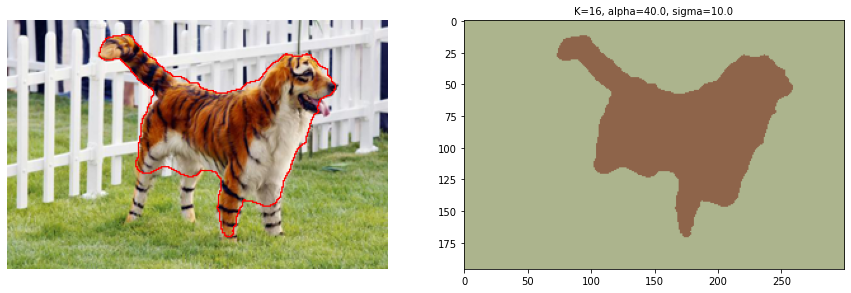

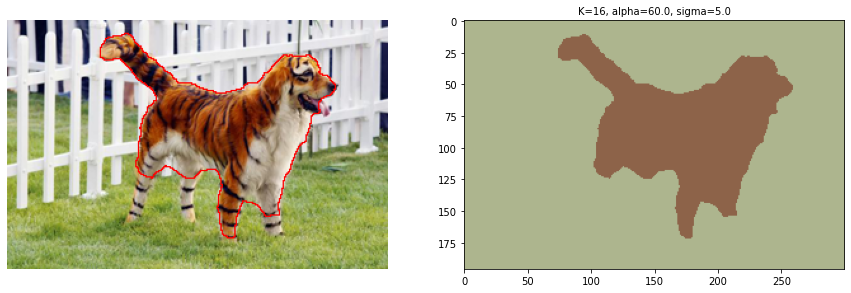

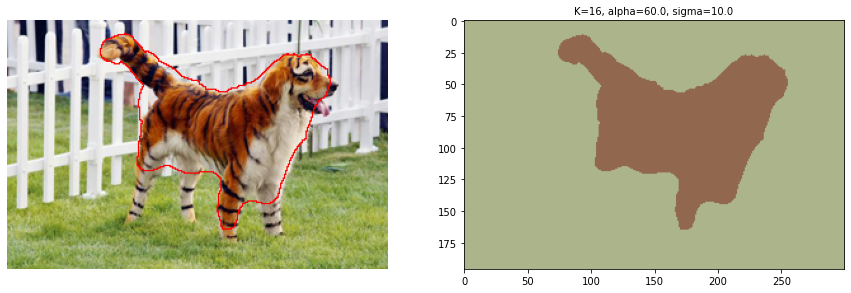

In [ ]:
#tiger3

alphas = [40.0, 60.0]
sigmas = [5.0, 10.0]

for a in alphas:
    for s in sigmas:
        graphcut_example(tiger3, K = 16, alpha = a, sigma = s, scale_factor = 0.5, area = [170, 90, 480, 300])

Question 12: How much can you lower K until the results get considerably worse?

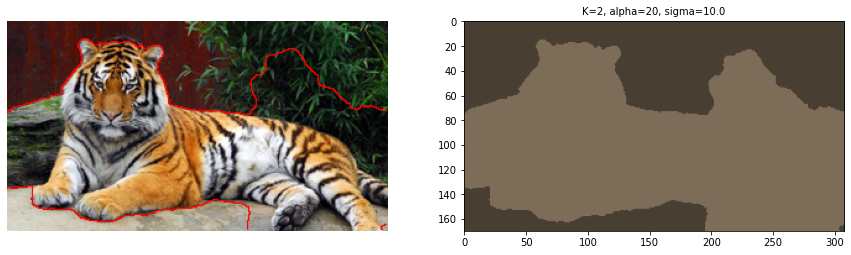

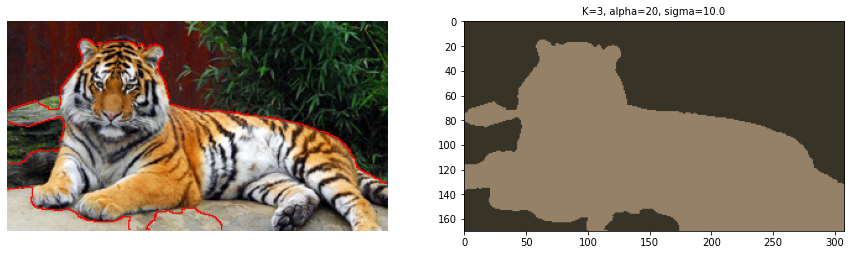

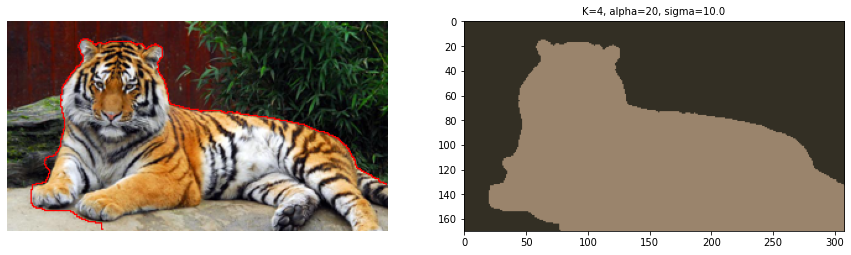

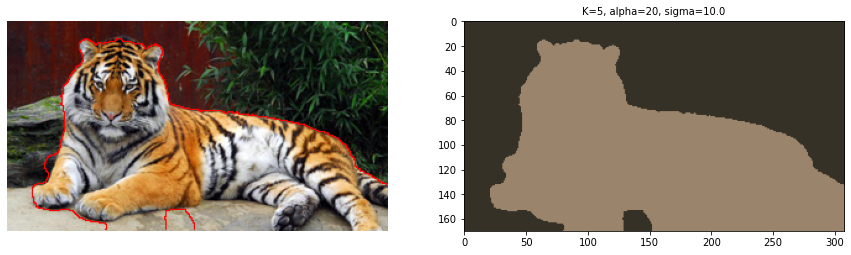

In [ ]:
#tiger 1
ks = [2,3,4,5]

for k in ks:
    graphcut_example(tiger1, K = k, alpha = 20, sigma = 10.0, scale_factor = 0.5, area = [80, 110, 570, 300])

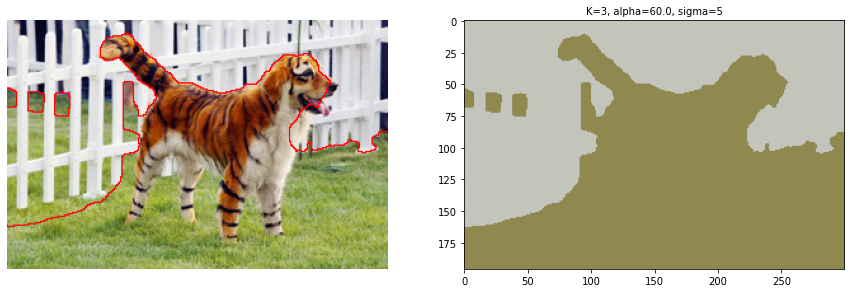

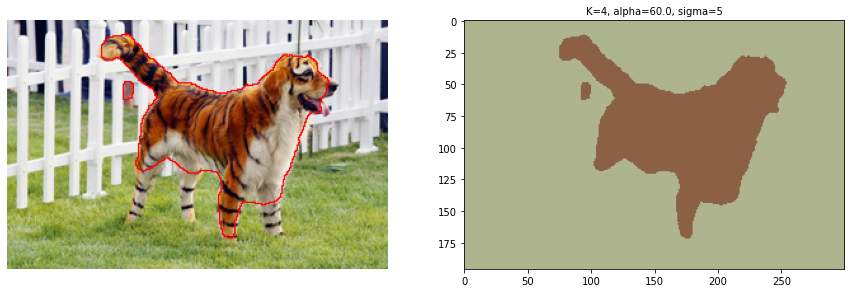

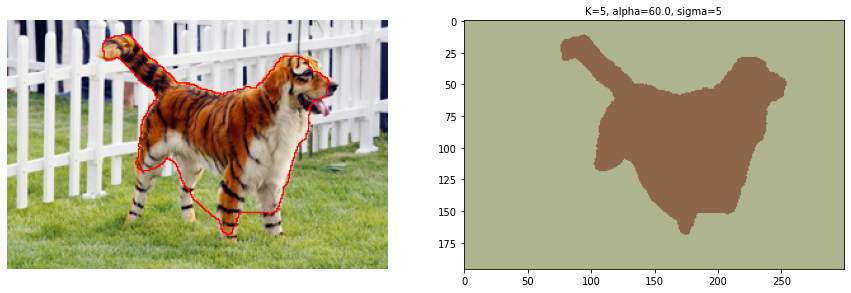

In [ ]:
#tiger3

ks = [3,4,5]
for k in ks:
    graphcut_example(tiger3, K = k, alpha = 60.0, sigma = 5, scale_factor = 0.5, area = [170, 90, 480, 300])

Question 13: Unlike the earlier method Graph Cut segmentation relies on some input from a user
for defining a rectangle. Is the benefit you get of this worth the effort? Motivate!

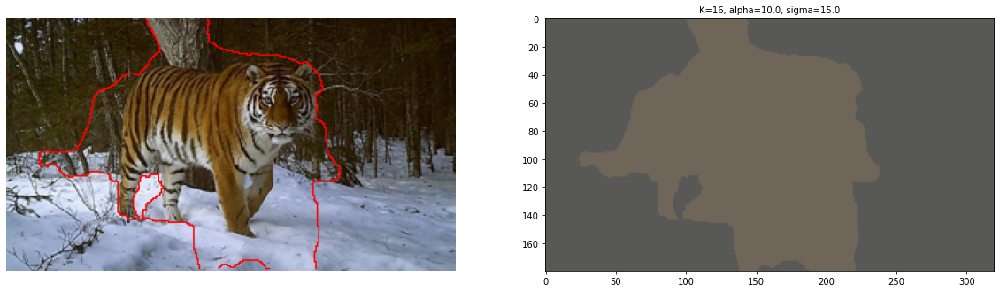

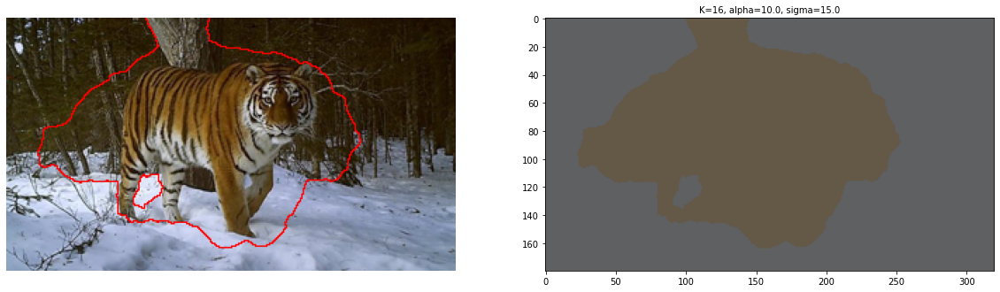

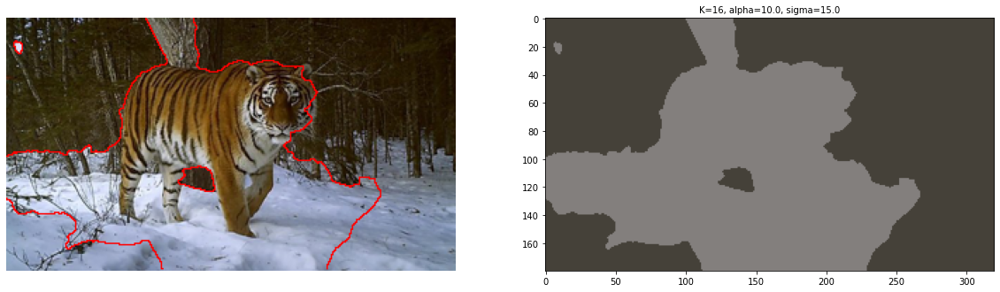

In [ ]:
#tiger2 different areas

areas = [[120, 110, 500, 300], [150, 120, 400, 300], [80, 110, 570, 300]]

for a in areas:
    graphcut_example(tiger2, K = 16, alpha = 10.0, sigma = 15.0, scale_factor = 0.5, area = a)

In [ ]:
%%shell
jupyter nbconvert --to html /content/drive/MyDrive/CV_Labs/Lab3/lab3-computervision.ipynb

[NbConvertApp] Converting notebook /content/drive/MyDrive/CV_Labs/Lab3/lab3-computervision.ipynb to html
[NbConvertApp] Writing 14798009 bytes to /content/drive/MyDrive/CV_Labs/Lab3/lab3-computervision.html
